### Spatial Autocorrelation for LA Traffic Collisions 2022

In [1]:
# import libraries
# to read and wrangle data
import pandas as pd

# to import data from LA Data portal
from sodapy import Socrata

# to create spatial data
import geopandas as gpd

# for basemaps
import contextily as ctx

# For spatial statistics
import esda
from esda.moran import Moran, Moran_Local

import splot
from splot.esda import moran_scatterplot, plot_moran, lisa_cluster,plot_moran_simulation

import libpysal as lps

# Graphics
import matplotlib.pyplot as plt
import plotly.express as px

### Block groups
We are going to summarize the location of collisions by block groups.

In [2]:
# to illustrate, bring in tracts
gdf_tracts = gpd.read_file('data/tracts.geojson')

In [3]:
# population block group data from census reporter
# gdf_bg = gpd.read_file('data/acs2019_5yr_B01003_15000US060372672002.geojson')
gdf_bg = gpd.read_file('data/acs2021_5yr_B01003_15000US060371041082.geojson')

<AxesSubplot: >

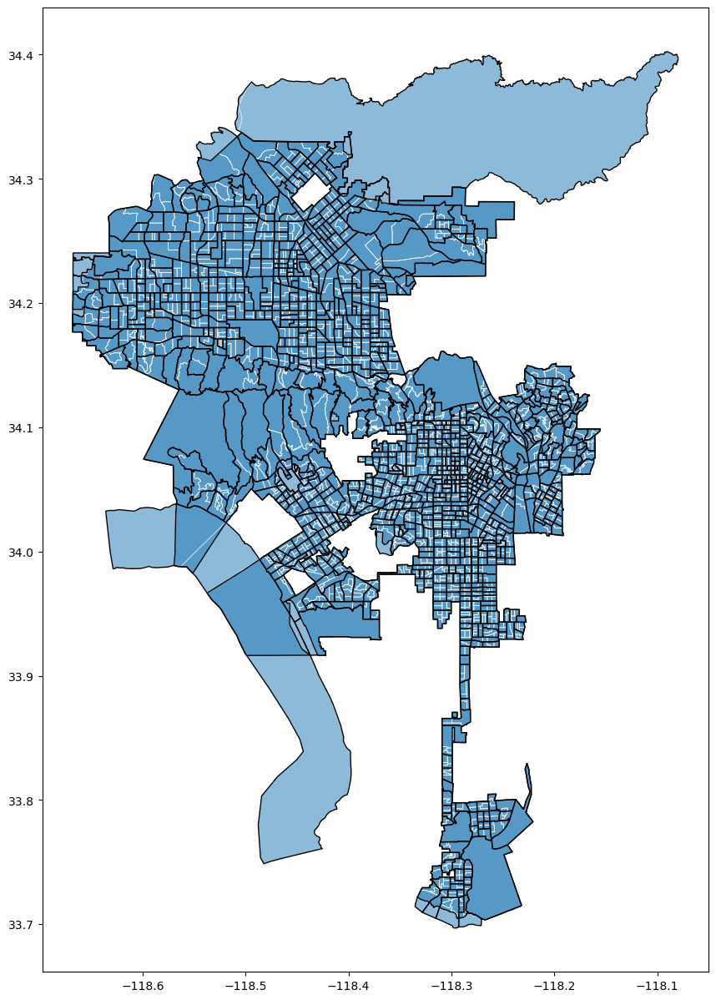

In [4]:
# compare
fig,ax = plt.subplots(figsize=(15,15))

# blue background of census tracts
gdf_tracts.plot(ax=ax,zorder=10,alpha=0.5)

# while lines to show block groups (sandwiched between the two layers above for visual clarity)
gdf_bg.boundary.plot(ax=ax,color='white',zorder=15,lw=0.5)

# black boundary lines of census tracts on top of everything
gdf_tracts.boundary.plot(ax=ax,color='black',zorder=20,lw=1)

### Data cleanup

In [5]:
# what does our data look like?
gdf_bg.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 2685 entries, 0 to 2684
Data columns (total 5 columns):
 #   Column            Non-Null Count  Dtype   
---  ------            --------------  -----   
 0   geoid             2685 non-null   object  
 1   name              2685 non-null   object  
 2   B01003001         2685 non-null   float64 
 3   B01003001, Error  2685 non-null   float64 
 4   geometry          2685 non-null   geometry
dtypes: float64(2), geometry(1), object(2)
memory usage: 105.0+ KB


In [6]:
# trim the data to the bare minimum columns
gdf_bg = gdf_bg[['geoid','B01003001','geometry']]

# rename the columns
gdf_bg.columns = ['FIPS','TotalPop','geometry']

In [7]:
# last rows
gdf_bg.tail()

,FIPS,TotalPop,geometry
2680,15000US060379800281,0.0,"MULTIPOLYGON (((-118.45246 33.94315, -118.4464..."
2681,15000US060379800311,1160.0,"MULTIPOLYGON (((-118.29105 33.75378, -118.2905..."
2682,15000US060379800391,0.0,"MULTIPOLYGON (((-118.36215 34.13903, -118.3612..."
2683,15000US060379902000,0.0,"MULTIPOLYGON (((-118.63598 34.03255, -118.6325..."
2684,16000US0644000,3902440.0,"MULTIPOLYGON (((-118.66818 34.18987, -118.6681..."


In [8]:
# delete last row which is for the entire city of LA
gdf_bg.drop(gdf_bg.tail(1).index,inplace=True)

In [9]:
# sort by total pop
gdf_bg.sort_values(by='TotalPop').head(20)

,FIPS,TotalPop,geometry
2683,15000US060379902000,0.0,"MULTIPOLYGON (((-118.63598 34.03255, -118.6325..."
2682,15000US060379800391,0.0,"MULTIPOLYGON (((-118.36215 34.13903, -118.3612..."
2676,15000US060379800221,0.0,"MULTIPOLYGON (((-118.50266 34.30809, -118.5026..."
2677,15000US060379800231,0.0,"MULTIPOLYGON (((-118.64870 34.23120, -118.6480..."
2247,15000US060372653012,0.0,"MULTIPOLYGON (((-118.44878 34.06862, -118.4486..."
2674,15000US060379800201,0.0,"MULTIPOLYGON (((-118.34414 34.21615, -118.3441..."
2680,15000US060379800281,0.0,"MULTIPOLYGON (((-118.45246 33.94315, -118.4464..."
2668,15000US060379800091,5.0,"MULTIPOLYGON (((-118.33707 34.14160, -118.3361..."
2679,15000US060379800261,16.0,"MULTIPOLYGON (((-118.35173 34.28034, -118.3517..."
2670,15000US060379800141,44.0,"MULTIPOLYGON (((-118.26088 33.76850, -118.2602..."


In [10]:
# delete less than 100 population geographies
gdf_bg = gdf_bg[gdf_bg['TotalPop']>100]

### Map the census block groups

In [11]:
# get the layers into a web mercator projection
# reproject to web mercator
gdf_bg = gdf_bg.to_crs(epsg=3857)

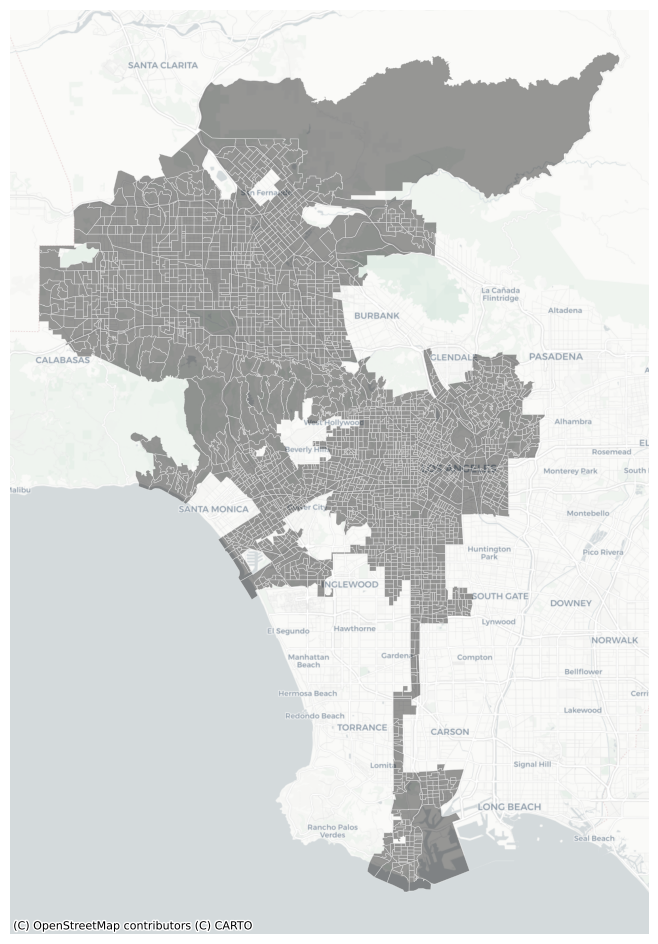

In [12]:
# plot it!
fig, ax = plt.subplots(figsize=(12,12))

gdf_bg.plot(ax=ax,
         color='black', 
         edgecolor='white',
         lw=0.5,
         alpha=0.4)

# no axis
ax.axis('off')

# add a basemap
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

### Get LA Traffic Collision Data

In [13]:
client = Socrata("data.lacity.org", None)

# First 2000 results, returned as JSON from API / converted to Python list of
# dictionaries by sodapy.
results = client.get("d5tf-ez2w", limit=2000)

# Convert to pandas DataFrame
collisions = pd.DataFrame.from_records(results)

# print it with .sample, which gives you random rows
collisions.sample(2)

,dr_no,date_rptd,date_occ,time_occ,area,area_name,rpt_dist_no,crm_cd,crm_cd_desc,mocodes,...,premis_desc,location,cross_street,location_1,:@computed_region_qz3q_ghft,:@computed_region_k96s_3jcv,:@computed_region_tatf_ua23,:@computed_region_ur2y_g4cx,:@computed_region_kqwf_mjcx,:@computed_region_2dna_qi2s
110,190814669,2019-08-24T00:00:00.000,2019-08-24T00:00:00.000,2055,08,West LA,0839,997,TRAFFIC COLLISION,3004 3026 3034 3036 3101 3401 3701 4008,...,STREET,AVENUE OF THE STARS,OLYMPIC BL,"{'latitude': '34.0565', 'longitude': '-118.413...",24032,870,739,9,6,75
302,191613097,2019-08-24T00:00:00.000,2019-08-24T00:00:00.000,1515,16,Foothill,1622,997,TRAFFIC COLLISION,3036 3101 3401 3701 4026 3015 3024 1218,...,STREET,SAN FERNANDO RD,LOUVRE ST,"{'latitude': '34.27', 'longitude': '-118.4262'...",18907,24,379,NaN,1,11


In [14]:
#only look at traffic collisions from January 2022 to December 2022
year_results = client.get("d5tf-ez2w", 
                     limit = 50000, # putting an arbitrary high number (otherwise defaults to 1000)
                     where = "date_occ between '2022-01-01T00:00:00' and '2022-12-31T00:00:00'"
                    )

In [15]:
# Convert to pandas DataFrame
lastyear_collisions = pd.DataFrame.from_records(year_results)

In [16]:
lastyear_collisions.tail(5)

,dr_no,date_rptd,date_occ,time_occ,area,area_name,rpt_dist_no,crm_cd,crm_cd_desc,mocodes,vict_age,vict_sex,vict_descent,premis_cd,premis_desc,location,cross_street,location_1
16354,231604002,2023-01-01T00:00:00.000,2022-12-31T00:00:00.000,2320,16,Foothill,1667,997,TRAFFIC COLLISION,3101 3011 3028 4016 3030 3034 3037,99,M,O,102,SIDEWALK,SUNLAND BL,SHADOW ISLAND,"{'latitude': '34.2498', 'longitude': '-118.346..."
16355,231204524,2023-01-10T00:00:00.000,2022-12-31T00:00:00.000,1521,12,77th Street,1269,997,TRAFFIC COLLISION,4025 3004 3028 3030,37,M,H,101,STREET,300 E MANCHESTER AV,NaN,"{'latitude': '33.9638', 'longitude': '-118.262..."
16356,230204688,2022-12-31T00:00:00.000,2022-12-31T00:00:00.000,1240,02,Rampart,0218,997,TRAFFIC COLLISION,0605 3030 4024,35,M,O,101,STREET,1500 W SUNSET BL,NaN,"{'latitude': '34.0758', 'longitude': '-118.255..."
16357,231504013,2023-01-01T00:00:00.000,2022-12-31T00:00:00.000,1230,15,N Hollywood,1562,997,TRAFFIC COLLISION,3004 3026 3029 3037 4015 3101,60,M,H,101,STREET,LAUREL CANYON BL,N LANDALE ST,"{'latitude': '34.1522', 'longitude': '-118.396..."
16358,230106871,2022-12-31T00:00:00.000,2022-12-31T00:00:00.000,1225,01,Central,0162,997,TRAFFIC COLLISION,0605 3030 4024,47,M,W,101,STREET,W 8TH ST,S OLIVE ST,"{'latitude': '34.0452', 'longitude': '-118.256..."


In [17]:
# create latitudue/longitude columns
lastyear_collisions['latitude'] = pd.json_normalize(lastyear_collisions['location_1'])['latitude']
lastyear_collisions['longitude'] = pd.json_normalize(lastyear_collisions['location_1'])['longitude']

# convert to floats
lastyear_collisions['latitude'] = lastyear_collisions['latitude'].astype('float')
lastyear_collisions['longitude'] = lastyear_collisions['longitude'].astype('float')

In [18]:
lastyear_collisions.shape

(16359, 20)

### Convert Data to Geodataframe

In [19]:
# convert pandas dataframe to geodataframe
lastyear_collisions = gpd.GeoDataFrame(lastyear_collisions, 
                         crs='EPSG:4326',
                         geometry=gpd.points_from_xy(lastyear_collisions.longitude, lastyear_collisions.latitude))

In [20]:
# get the layers into a web mercator projection
# reproject to web mercator
lastyear_collisions = lastyear_collisions.to_crs(epsg=3857)

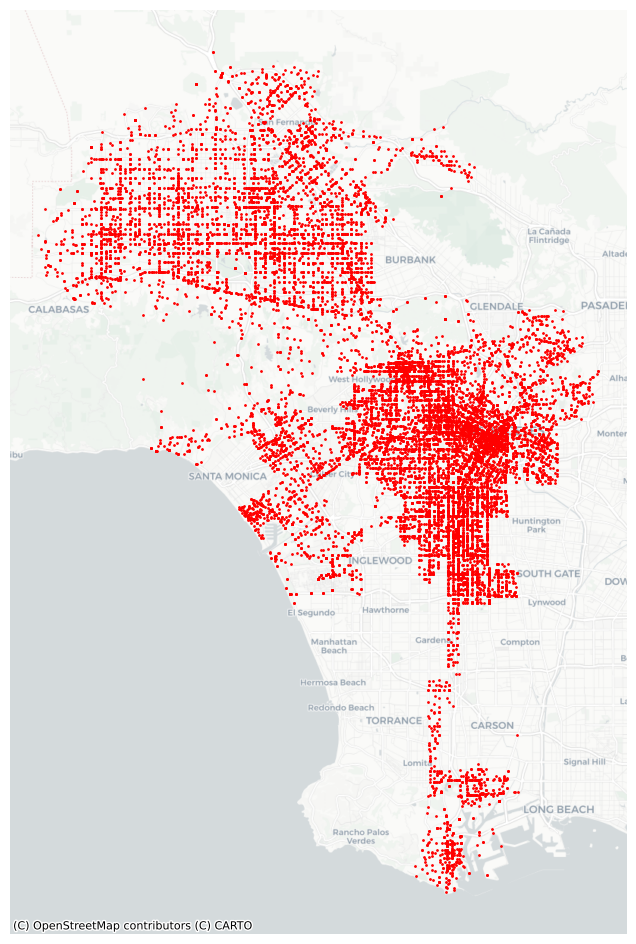

In [21]:
# map it!
fig,ax = plt.subplots(figsize=(12,12))

lastyear_collisions.plot(ax=ax,
             color='red',
             markersize=1)

# no axis
ax.axis('off')

# add a basemap
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

### Create a Two Layer Map

In [22]:
# get the bounding box coordinates for the arrest data
minx, miny, maxx, maxy = lastyear_collisions.geometry.total_bounds
print(minx)
print(maxx)
print(miny)
print(maxy)

-13209493.604053142
-13152998.962475557
3989459.9034047048
4074170.117207035


### Subplots for Multilayer maps
For our multi-layered maps, we are taking it one step further from our previous lab using matplotlib's `subplots`. `subplots` allows the creation of multiple plots on a gridded canvas. For our map, we only need a single subplot, but we are layering multiple datasets *on top of one another* on that subplot. To specify which subplot to put the layer on, you use the `ax` argument.

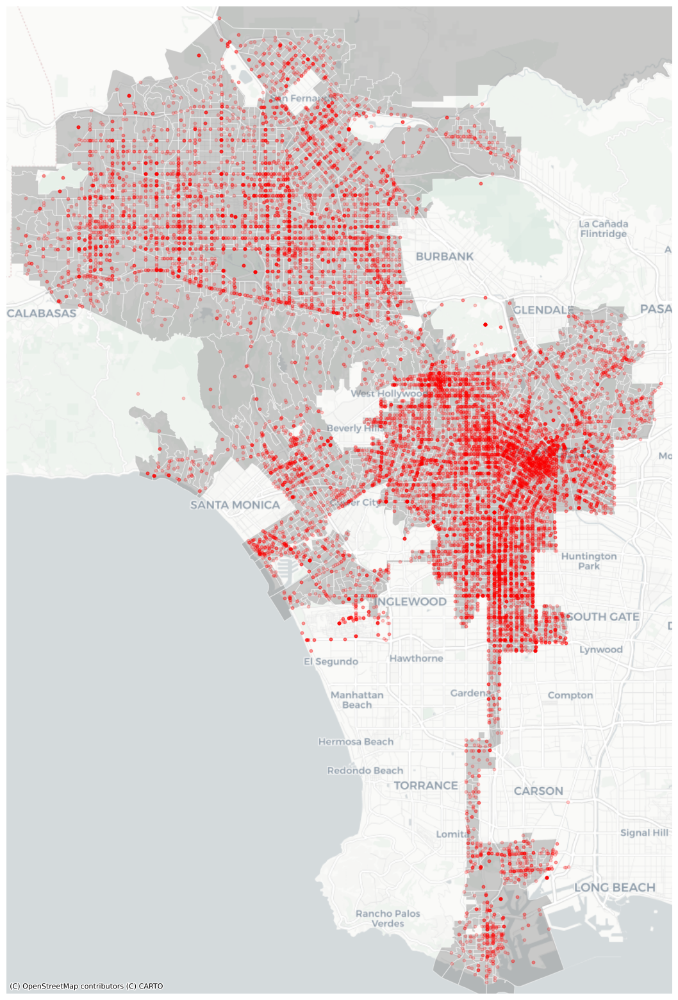

In [23]:
# set up the plot canvas with plt.subplots
fig, ax = plt.subplots(figsize=(20, 20))

# block groups
gdf_bg.plot(ax=ax, # this puts it in the ax plot
        color='gray', 
        edgecolor='white',
        alpha=0.4)

# collisions
lastyear_collisions.plot(ax=ax, # this also puts it in the same ax plot
        color='red',
        markersize=10,
        alpha=0.2)

# use the bounding box coordinates to set the x and y limits
ax.set_xlim(minx - 1000, maxx + 1000) # added/substracted value is to give some margin around total bounds
ax.set_ylim(miny - 1000, maxy + 1000)

# no axis
ax.axis('off')

# add a basemap
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

### Time for a Spatial Join (notes from Yoh)
In a Spatial Join, two geometry objects are merged based on their spatial relationship to one another.

When you do a spatial join with gpd.sjoin(), you feed it three arguments: a left dataframe, a right dataframe, and a how statement.

Left dataframe: identify the layer you want to attach infomation that will come from the other layer.
Right dataframe: identify the layer that you want to get information from to attach to the other layer.
Once you identify your left and right dataframes, use how="left" to spatially join the two layers (think: "I'm sending data from the right to the left"). Note that this will result in a dataframe with the same records and datatype as the LEFT layer if it is a perfect one to one match. However, if there are multiple matches from the right dataframe to the left, it will create multiple rows, one for each match.

In [24]:
# check number of records before join
lastyear_collisions.shape

(16359, 21)

In [25]:
# Do the spatial join
join = gpd.sjoin(gdf_bg, lastyear_collisions, how='left')

In [26]:
# check number of records after join
join.shape

(16297, 24)

In [27]:
#create dataframe that counts collisions by their corresponding block group:
collisions_by_bg = join.FIPS.value_counts().rename_axis('FIPS').reset_index(name='collisions_count')
collisions_by_bg

,FIPS,collisions_count
0,15000US060372074001,80
1,15000US060372260021,74
2,15000US060372060511,71
3,15000US060372077111,68
4,15000US060372079021,66
...,...,...
2666,15000US060371959032,1
2667,15000US060371972002,1
2668,15000US060371974101,1
2669,15000US060371992011,1


<AxesSubplot: xlabel='FIPS'>

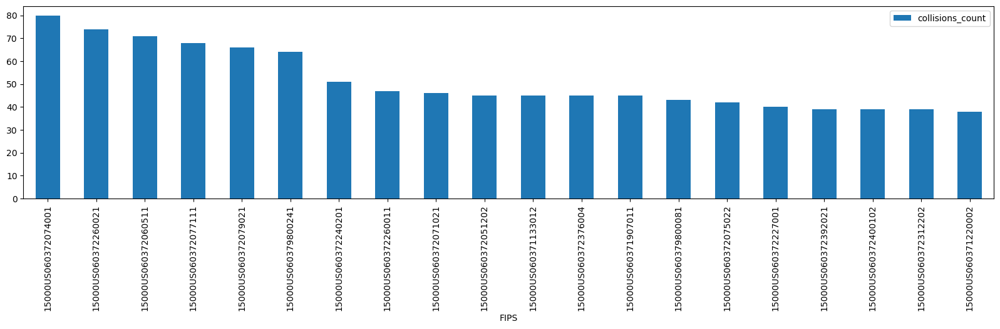

In [28]:
# make a bar chart of top 20 geographies
collisions_by_bg[:20].plot.bar(figsize=(20,4),
                             x='FIPS',
                             y='collisions_count')

<AxesSubplot: ylabel='Frequency'>

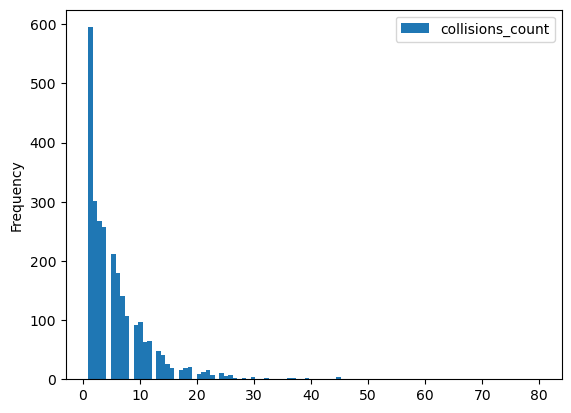

In [29]:
collisions_by_bg.plot.hist(bins=100)

{'whiskers': [<matplotlib.lines.Line2D at 0x7f36f4e75b70>,
 'caps': [<matplotlib.lines.Line2D at 0x7f36f4e76620>,
 'boxes': [<matplotlib.lines.Line2D at 0x7f36f4e75f90>],
 'medians': [<matplotlib.lines.Line2D at 0x7f36f4e74b50>],
 'fliers': [<matplotlib.lines.Line2D at 0x7f36f4e75a80>],
 'means': []}

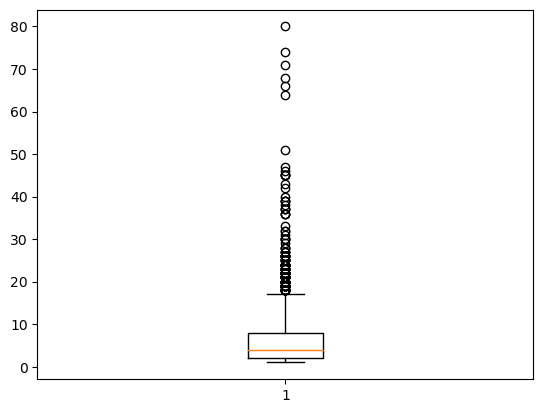

In [30]:
plt.boxplot(collisions_by_bg.collisions_count)

### Join value counts back to the gdf

In [31]:
# join the summary table back to the gdf
gdf_bg=gdf_bg.merge(collisions_by_bg,on='FIPS')

In [32]:
# our block group table now has a count column
gdf_bg.sample(10)

,FIPS,TotalPop,geometry,collisions_count
847,15000US060371393023,945.0,"MULTIPOLYGON (((-13195892.923 4052257.922, -13...",1
1987,15000US060372361022,2178.0,"MULTIPOLYGON (((-13174509.784 4030364.161, -13...",1
734,15000US060371343041,1192.0,"MULTIPOLYGON (((-13203648.663 4058326.117, -13...",16
1347,15000US060372035003,901.0,"MULTIPOLYGON (((-13160495.106 4035931.602, -13...",2
293,15000US060371153013,1180.0,"MULTIPOLYGON (((-13197323.601 4061827.570, -13...",1
1348,15000US060372036011,1094.0,"MULTIPOLYGON (((-13159099.716 4035821.831, -13...",8
984,15000US060371834021,1140.0,"MULTIPOLYGON (((-13160054.392 4045197.719, -13...",4
311,15000US060371172011,1434.0,"MULTIPOLYGON (((-13188341.342 4061768.856, -13...",5
498,15000US060371241022,939.0,"MULTIPOLYGON (((-13178498.584 4052429.881, -13...",6
629,15000US060371285004,1073.0,"MULTIPOLYGON (((-13185661.882 4051923.698, -13...",9


### Normalizing: Collisions per 1000 people
Rather than proceeding with an absolute count of collisions, let's normalize it by number of people who live in the census block group.

In [33]:
gdf_bg['collisions_per_1000'] = gdf_bg['collisions_count']/gdf_bg['TotalPop']*1000
gdf_bg.sort_values(by="collisions_per_1000").tail()

,FIPS,TotalPop,geometry,collisions_count,collisions_per_1000
1797,15000US060372240201,775.0,"MULTIPOLYGON (((-13166257.559 4033229.280, -13...",51,65.806452
1397,15000US060372060511,406.0,"MULTIPOLYGON (((-13162384.420 4030801.699, -13...",71,174.876847
2666,15000US060379800101,109.0,"MULTIPOLYGON (((-13163713.575 4039600.478, -13...",23,211.009174
2665,15000US060379800081,150.0,"MULTIPOLYGON (((-13191656.548 4058543.673, -13...",43,286.666667
2669,15000US060379800241,200.0,"MULTIPOLYGON (((-13193418.068 4053521.172, -13...",64,320.000000


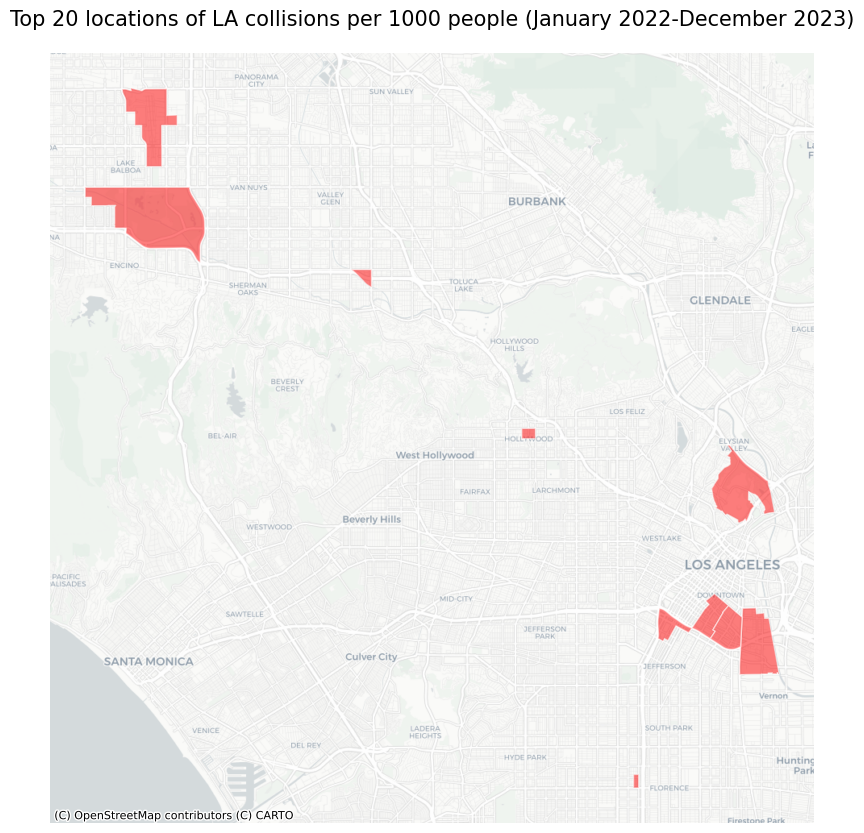

In [34]:
# map the top 20 geographies
fig,ax = plt.subplots(figsize=(12,10))
gdf_bg.sort_values(by='collisions_per_1000',ascending=False)[:10].plot(ax=ax,
                                                                 color='red',
                                                                 edgecolor='white',
                                                                 alpha=0.5)


# title
ax.set_title('Top 20 locations of LA collisions per 1000 people (January 2022-December 2023)',fontsize=15,pad=20)

# no axis
ax.axis('off')

# add a basemap
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

### Choropleth Map of Collisions

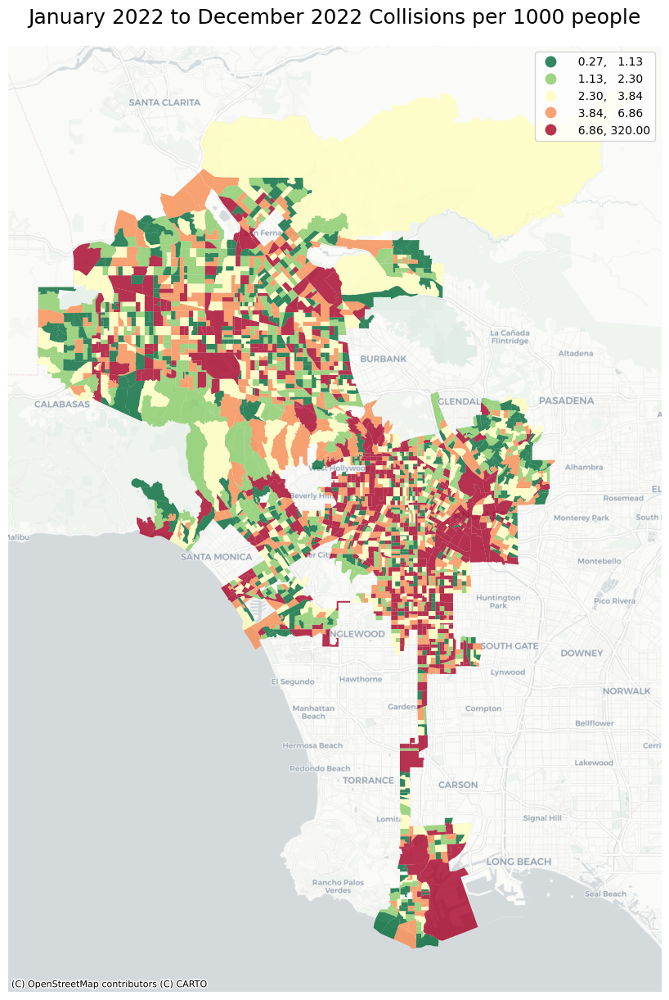

In [35]:
fig,ax = plt.subplots(figsize=(15,15))

gdf_bg.plot(ax=ax,
        column='collisions_per_1000', # this defines the field to "choropleth"
        legend=True,
        alpha=0.8,
        cmap='RdYlGn_r', # the "_r" reverses the color
        scheme='quantiles')

ax.axis('off')
ax.set_title('January 2022 to December 2022 Collisions per 1000 people',fontsize=18,pad=20)
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

We can see collisions concentrated mostly in Downtown LA, San Pedro, areas in the Valley, and a majority of South LA.

### Global Spatial Autocorrelation

In [57]:
# calculate spatial weight
wq =  lps.weights.KNN.from_dataframe(gdf_bg,k=8)

# Row-standardization
wq.transform = 'r'

### Spatial Lag

In [37]:
# create a new column for the spatial lag
gdf_bg['collisions_per_1000_lag'] = lps.weights.lag_spatial(wq, gdf_bg['collisions_per_1000'])

In [38]:
# take a look at some sample rows
gdf_bg.sample(10)[['FIPS','TotalPop','collisions_count','collisions_per_1000','collisions_per_1000_lag']]

,FIPS,TotalPop,collisions_count,collisions_per_1000,collisions_per_1000_lag
905,15000US060371416002,1141.0,1,0.876424,3.391194
1804,15000US060372243202,1432.0,10,6.983240,4.602900
14,15000US060371014001,839.0,5,5.959476,1.887367
395,15000US060371203001,675.0,1,1.481481,3.391693
296,15000US060371153022,1272.0,14,11.006289,5.665632
2155,15000US060372412024,920.0,2,2.173913,8.034191
211,15000US060371112053,1692.0,1,0.591017,0.921956
1233,15000US060371953001,738.0,1,1.355014,3.364128
537,15000US060371252002,1174.0,19,16.183986,3.111616
1494,15000US060372098202,1028.0,1,0.972763,5.464542


### The Donut and The Diamond

In [39]:
# create a column that calculates the difference between collisions and lag
gdf_bg['collisions_lag_diff'] = gdf_bg['collisions_per_1000'] - gdf_bg['collisions_per_1000_lag']

In [40]:
# output to get the head and tail
gdf_bg.sort_values(by='collisions_lag_diff')

,FIPS,TotalPop,geometry,collisions_count,collisions_per_1000,collisions_per_1000_lag,collisions_lag_diff
871,15000US060371397015,682.0,"MULTIPOLYGON (((-13191481.331 4051699.273, -13...",1,1.466276,44.631792,-43.165516
690,15000US060371321013,1429.0,"MULTIPOLYGON (((-13191483.446 4054251.090, -13...",3,2.099370,43.168045,-41.068674
577,15000US060371274002,1557.0,"MULTIPOLYGON (((-13189788.050 4056808.730, -13...",1,0.642261,41.257182,-40.614921
691,15000US060371321021,231.0,"MULTIPOLYGON (((-13191486.229 4057459.033, -13...",1,4.329004,42.563397,-38.234392
576,15000US060371274001,1351.0,"MULTIPOLYGON (((-13189542.814 4058559.828, -13...",7,5.181347,40.341687,-35.160340
...,...,...,...,...,...,...,...
2028,15000US060372376004,711.0,"MULTIPOLYGON (((-13167410.829 4025590.204, -13...",45,63.291139,7.705001,55.586138
1397,15000US060372060511,406.0,"MULTIPOLYGON (((-13162384.420 4030801.699, -13...",71,174.876847,17.734215,157.142632
2666,15000US060379800101,109.0,"MULTIPOLYGON (((-13163713.575 4039600.478, -13...",23,211.009174,3.220187,207.788987
2665,15000US060379800081,150.0,"MULTIPOLYGON (((-13191656.548 4058543.673, -13...",43,286.666667,6.256901,280.409766


In [41]:
# the FIPS with highest negative difference
gdf_donut = gdf_bg.sort_values(by='collisions_lag_diff').head(1)
gdf_donut

,FIPS,TotalPop,geometry,collisions_count,collisions_per_1000,collisions_per_1000_lag,collisions_lag_diff
871,15000US060371397015,682.0,"MULTIPOLYGON (((-13191481.331 4051699.273, -13...",1,1.466276,44.631792,-43.165516


In [42]:
# the FIPS with highest positive difference
gdf_diamond = gdf_bg.sort_values(by='collisions_lag_diff').tail(1)
gdf_diamond

,FIPS,TotalPop,geometry,collisions_count,collisions_per_1000,collisions_per_1000_lag,collisions_lag_diff
2669,15000US060379800241,200.0,"MULTIPOLYGON (((-13193418.068 4053521.172, -13...",64,320.0,2.621096,317.378904


### Satellite Exploration

In [43]:
# map the donut
gdf_donut.explore(tiles='https://server.arcgisonline.com/ArcGIS/rest/services/World_Imagery/MapServer/tile/{z}/{y}/{x}',
                  attr='Tiles &copy; Esri &mdash; Source: Esri, i-cubed, USDA, USGS, AEX, GeoEye, Getmapping, Aerogrid, IGN, IGP, UPR-EGP, and the GIS User Community')

In [44]:
# map the diamond
gdf_diamond.explore(tiles='https://server.arcgisonline.com/ArcGIS/rest/services/World_Imagery/MapServer/tile/{z}/{y}/{x}',
                  attr='Tiles &copy; Esri &mdash; Source: Esri, i-cubed, USDA, USGS, AEX, GeoEye, Getmapping, Aerogrid, IGN, IGP, UPR-EGP, and the GIS User Community')

The donut is a low rate collision neighborhood surrounded by a high rate collision neighborhoods. The diamond is a high rate collision neighborhood surrounded by low rate colllision neighborhoods. In this case, the donut is adjacent to the diamond, which is most likely what caused that area to be marked as a donut. Within the diamond, there is a highway which most likely accounts for the large amounts of collisions, as well as the overall larger land mass that the diamond comprises compared to the smaller size of the donut.

## Spatial lag map
Let's map the entire dataframe by the newly created spatial lag column.

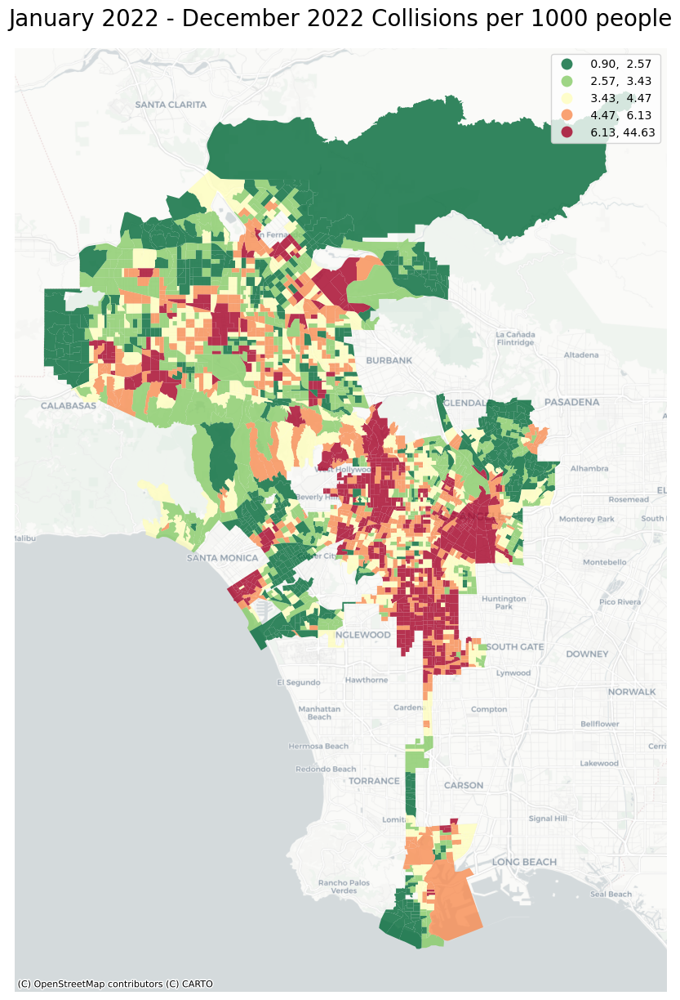

In [45]:
# use subplots that make it easier to create multiple layered maps
fig, ax = plt.subplots(figsize=(15, 15))

# spatial lag choropleth
gdf_bg.plot(ax=ax,
         figsize=(15,15),
         column='collisions_per_1000_lag',
         legend=True,
         alpha=0.8,
         cmap='RdYlGn_r',
         scheme='quantiles')

ax.axis('off')
ax.set_title('January 2022 - December 2022 Collisions per 1000 people',fontsize=20,pad=20)

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

## Side-by-side maps
We can now compare these two map outputs side by side. 

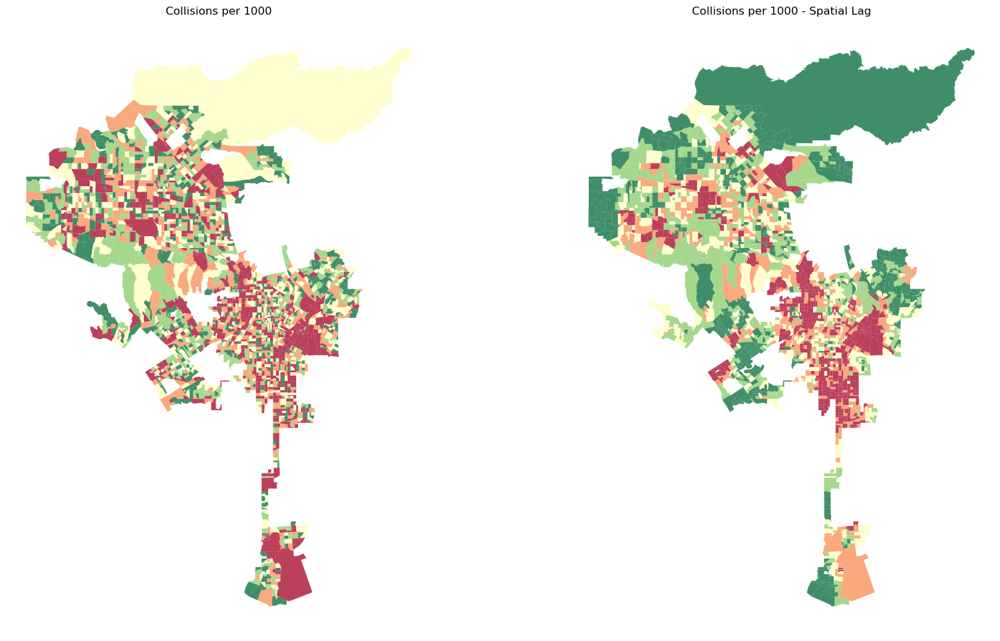

In [46]:
# create the 1x2 subplots
fig, ax = plt.subplots(1, 2, figsize=(20, 12))

# two subplots produces ax[0] (left) and ax[1] (right)

# regular count map on the left
gdf_bg.plot(ax=ax[0], # this assigns the map to the left subplot
         column='collisions_per_1000', 
         cmap='RdYlGn_r', 
         scheme='quantiles',
         k=5, 
         edgecolor='white', 
         linewidth=0, 
         alpha=0.75, 
           )


ax[0].axis("off")
ax[0].set_title("Collisions per 1000")

# spatial lag map on the right
gdf_bg.plot(ax=ax[1], # this assigns the map to the right subplot
         column='collisions_per_1000_lag', 
         cmap='RdYlGn_r', 
         scheme='quantiles',
         k=5, 
         edgecolor='white', 
         linewidth=0, 
         alpha=0.75
           )

ax[1].axis("off")
ax[1].set_title("Collisions per 1000 - Spatial Lag")

plt.show()

On both maps, Downtown LA and South Central stays consistently high in collisions; However, when we look at the spatial lag, we see that areas in South Central LA begin more dense with collisions, as those areas are surrounded by other high rate collision areas. The Valley also has lower rates of collision in the spatial lag data, meaning neighborhoods with high rates of collision are less likely to be surrounding each other versus the neighborhoods in South Central LA.

## Interactive spatial lag satellite map

In [47]:
# a quick interactive version: geopandas .explore function does it all, no need to import folium!
gdf_bg.explore(
        column='collisions_per_1000_lag', # this defines the field to "choropleth"
        legend=True,
        cmap='RdYlGn_r', # the "_r" reverses the color
        scheme='naturalbreaks',
        style_kwds={
            'weight':0.5,
            'color':'black',
            'opacity':0.5
        },
        tiles='https://server.arcgisonline.com/ArcGIS/rest/services/World_Imagery/MapServer/tile/{z}/{y}/{x}',
        attr='Tiles &copy; Esri &mdash; Source: Esri, i-cubed, USDA, USGS, AEX, GeoEye, Getmapping, Aerogrid, IGN, IGP, UPR-EGP, and the GIS User Community'
        )

### Moran's plot

- Positive spatial autocorrelation: high values are close to high values, and/or low values are close to low values
- Negative spatial autocorrelation (less common): similar values are far from each other; high values are next to low values, low values are next to high values

In [48]:
y = gdf_bg.collisions_per_1000
moran = Moran(y, wq)
moran.I
#looking for a positive or negative autocorrelation

0.03965301423623988

We have a positive autocorrelation which means that high counts of collisions are located near other high counts of collisions while low counts of collisions are near low counts of collisions.

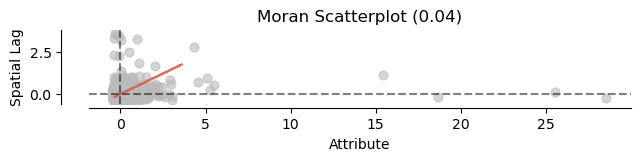

In [49]:
fig, ax = moran_scatterplot(moran, aspect_equal=True)
plt.show()

YOH: So what is the significance of our Moran value? In other words, how likely is our observed pattern on the map generated by an entirely random process? To find out, we compare our value with a simulation of 999 permutations that randomly shuffles the collision data throughout the given geographies. The output is a sampling distribution of Moran’s I values under the (null) hypothesis that attribute values are randomly distributed across the study area. We then compare our observed Moran’s I value to this "Reference Distribution."

/opt/conda/lib/python3.10/site-packages/splot/_viz_esda_mpl.py:354: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sbn.kdeplot(moran.sim, shade=shade, color=color, ax=ax, **kwargs)


(<Figure size 700x700 with 1 Axes>,
 <AxesSubplot: title={'center': 'Reference Distribution'}, xlabel='Moran I: 0.04', ylabel='Density'>)

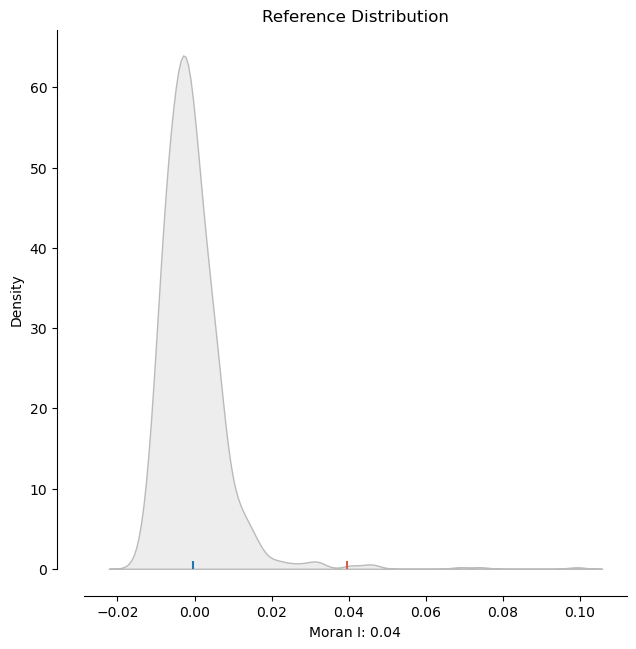

In [50]:
plot_moran_simulation(moran,aspect_equal=False)

The Moran I value, where if a randomly generated sample of our data was done, it would be at 0.04

let us compute the p-value:

In [51]:
moran.p_sim

0.009

Our p-value is less than the alpha level 0.05 (0.006 < 0.05), we can reject the null hypothesis that our observed pattern on our map is generated randomly. We are 95% confident that the map displays more spatial pattern than we would expect if the values had been randomly allocated to a locations.

# Local Spatial Autocorrelation
So far, we have only determined that there is a positive spatial autocorrelation between the number of collisions in census block groups and their locations. But we have not detected where clusters are. Local Indicators of Spatial Association (LISA) is used to do that. LISA classifies areas into four groups: high values near to high values (HH), Low values with nearby low values (LL), Low values with high values in its neighborhood, and vice-versa.

- HH: high collision rate geographies near other high collision rate neighbors
- LL: low collision rate geographies near other low collision rate neighbors
- LH (donuts): low collision rate geographies surrounded by high collision neighbors
- HL (diamonds): high collision rate geographies surrounded by low collision neighbors

### Moran Local Scatterplot

In [52]:
# calculate local moran values
lisa = esda.moran.Moran_Local(y, wq)

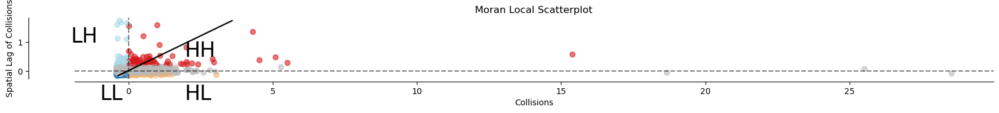

In [53]:
# Plot
fig,ax = plt.subplots(figsize=(20,15))

moran_scatterplot(lisa, ax=ax, p=0.05)
ax.set_xlabel("Collisions")
ax.set_ylabel('Spatial Lag of Collisions')

# add some labels
plt.text(1.95, 0.5, "HH", fontsize=25)
plt.text(1.95, -1, "HL", fontsize=25)
plt.text(-2, 1, "LH", fontsize=25)
plt.text(-1, -1, "LL", fontsize=25)
plt.show()

In the scatterplot above, the colored dots represents the rows (census block groups) that have a P-value less that 0.05 in each quadrant. In other words, these are the statisticaly significantly, spatially autocorrelated geographies.

### Spatial Autocorrelation Map
Let's visually see these statistically significant clusters using the lisa_cluster function:

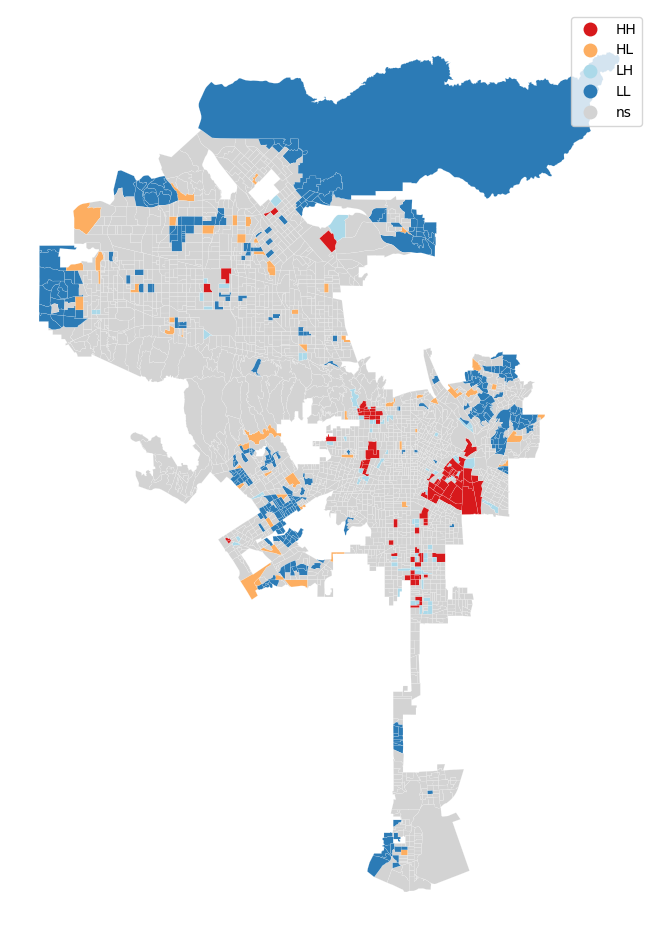

In [54]:
fig, ax = plt.subplots(figsize=(14,12))
lisa_cluster(lisa, gdf_bg, p=0.05, ax=ax)
plt.show()

### Maps Comparing Different P-values

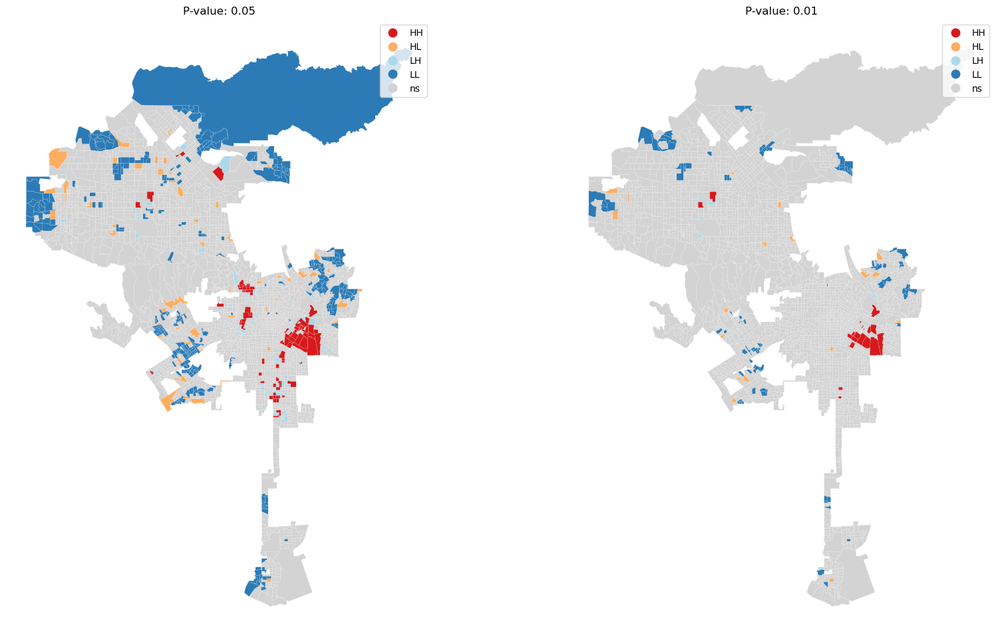

In [55]:
# create the 1x2 subplots
fig, ax = plt.subplots(1, 2, figsize=(20, 12))

# regular count map on the left
lisa_cluster(lisa, gdf_bg, p=0.05, ax=ax[0])

ax[0].axis("off")
ax[0].set_title("P-value: 0.05")

# spatial lag map on the right
lisa_cluster(lisa, gdf_bg, p=0.01, ax=ax[1])
ax[1].axis("off")
ax[1].set_title("P-value: 0.01")

plt.show()

The first map shows the clusters that are statistically significant with a p-value of 0.05, which means we are 95% confident that these are the clusters are spatially autocorrelated. The map on the right shows the clusters that are statistically significant with a p-value of 0.01, which means we are 99% confident that these are the clusters that are spatially correlated.